In [23]:
%load_ext autoreload
%autoreload 2
#%env CUDA_VISIBLE_DEVICES=3

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
colab_requirements = [
    "pip install librosa",
    "pip install noisereduce",
    "pip install soundfile",

]



def run_subprocess_command(cmd):
    # run the command
    process = subprocess.Popen(cmd.split(), stdout=subprocess.PIPE)
    # print the output
    for line in process.stdout:
        print(line.decode().strip())

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    for i in colab_requirements:
        run_subprocess_command(i)

In [26]:
import IPython
from scipy.io import wavfile
import noisereduce as nr
import soundfile as sf
from noisereduce.generate_noise import band_limited_noise
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import io
import sys, subprocess
import matplotlib.pyplot as plt
from matplotlib import style
import scipy.fftpack
import scipy as sp
from scipy.stats import zscore
import pandas as pd
from scipy.signal import butter, filtfilt
from scipy import signal
import warnings
%matplotlib inline

### Load data

In [27]:
url = "https://github.com/andjelatodorovich/audio_analysis/blob/main/TeraLogicsOverview.wav?raw=true"
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))
data = data
print(type(data))

<class 'numpy.ndarray'>


In [28]:
IPython.display.Audio(data=data, rate=rate)

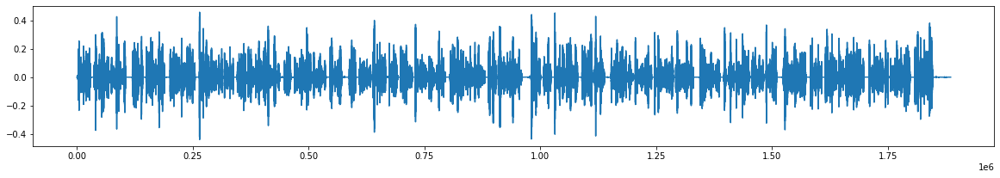

In [29]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

### Stationary remove noise

In [30]:
reduced_noise = nr.reduce_noise(y = data, sr=rate, n_std_thresh_stationary=1.5,stationary=True)
print(type(reduced_noise))


<class 'numpy.memmap'>


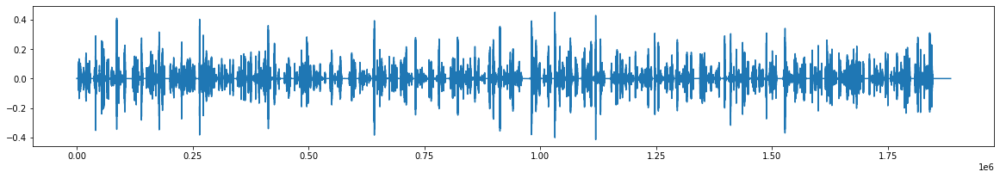

In [31]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(reduced_noise)

In [32]:
IPython.display.Audio(data=reduced_noise, rate=rate)

### Non-stationary noise reduction

In [33]:
reduced_noise = nr.reduce_noise(y = data, sr=rate, thresh_n_mult_nonstationary=2,stationary=False)

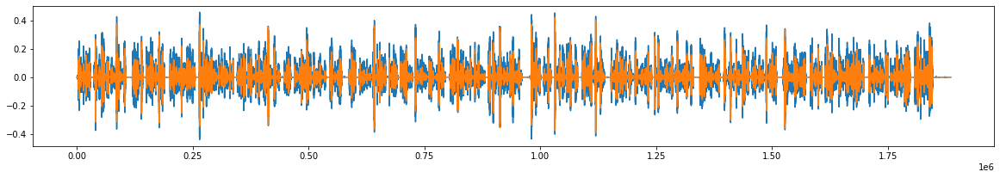

In [34]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)
ax.plot(reduced_noise)

In [35]:
IPython.display.Audio(data=reduced_noise, rate=rate)

# Silence removal

In [39]:
data = data[~np.isnan(data)]
data = sp.signal.detrend(data)
N = len(data)

fft_data = sp.fftpack.fft(data)
f = np.linspace(0, N/16000, N)

In [48]:
reduced_noise = reduced_noise[~np.isnan(reduced_noise)]
reduced_noise = sp.signal.detrend(reduced_noise)

fft_reduced_noise = sp.fftpack.fft(reduced_noise)
f = np.linspace(0, N/16000, N)

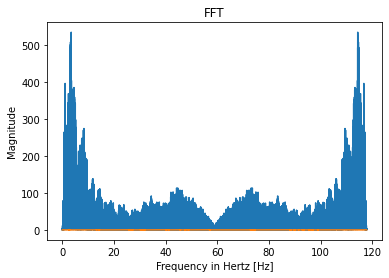

In [51]:
plt.plot(f, np.abs(fft_data))
plt.plot(f, np.abs(reduced_noise))
plt.xlabel('Frequency in Hertz [Hz]')
plt.ylabel('Magnitude')
plt.title('FFT')
plt.show()
plt.close()

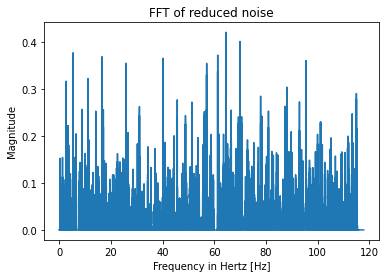

In [52]:
plt.plot(f, np.abs(reduced_noise))
plt.xlabel('Frequency in Hertz [Hz]')
plt.ylabel('Magnitude')
plt.title('FFT of reduced noise')
plt.show()
plt.close()